In [8]:
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow_docs.vis import embed
import numpy as np
import cv2

import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
import matplotlib.patches as patches

from helpers.movenet_helpers import _keypoints_and_edges_for_display

import imageio
from IPython.display import HTML, display

In [19]:
model_name = 'movenet_thunder'
if model_name == 'movenet_lightning':
    module = hub.load('https://tfhub.dev/google/movenet/singlepose/lightning/4')
    input_size = 192
elif model_name == 'movenet_thunder':
    module = hub.load('https://www.kaggle.com/models/google/movenet/TensorFlow2/singlepose-thunder/4')
    input_size = 256
else:
    raise ValueError("Unsupported model_name name: %s" % model_name)

In [20]:
def movenet(input_image):
    model = module.signatures['serving_default']

    input_image = tf.cast(input_image, dtype=tf.int32)
    outputs = model(input_image)
    keypoints_with_scores = outputs['output_0'].numpy()
    return keypoints_with_scores

def predict(gif):
    num_frames, org_height, org_width, _ = gif.shape
    crop_region = init_crop_region(org_height, org_width)
    kps_edges = []
    
    for i in range(num_frames):
        kps_scores = run_inference(
            movenet,
            gif[i, :, :, :],
            crop_region,
            crop_size=[input_size, input_size]
        )
        kps_edges.append(_keypoints_and_edges_for_display(
            kps_scores,
            org_height,
            org_width
        ))
        crop_region = determine_crop_region(
            kps_scores, 
            org_height, 
            org_width
        )
    return kps_edges


In [21]:
#@title Helper functions for visualization

# Dictionary that maps from joint names to keypoint indices.
KEYPOINT_DICT = {
    'nose': 0,
    'left_eye': 1,
    'right_eye': 2,
    'left_ear': 3,
    'right_ear': 4,
    'left_shoulder': 5,
    'right_shoulder': 6,
    'left_elbow': 7,
    'right_elbow': 8,
    'left_wrist': 9,
    'right_wrist': 10,
    'left_hip': 11,
    'right_hip': 12,
    'left_knee': 13,
    'right_knee': 14,
    'left_ankle': 15,
    'right_ankle': 16
}

# Maps bones to a matplotlib color name.
KEYPOINT_EDGE_INDS_TO_COLOR = {
    (0, 1): 'm',
    (0, 2): 'c',
    (1, 3): 'm',
    (2, 4): 'c',
    (0, 5): 'm',
    (0, 6): 'c',
    (5, 7): 'm',
    (7, 9): 'm',
    (6, 8): 'c',
    (8, 10): 'c',
    (5, 6): 'y',
    (5, 11): 'm',
    (6, 12): 'c',
    (11, 12): 'y',
    (11, 13): 'm',
    (13, 15): 'm',
    (12, 14): 'c',
    (14, 16): 'c'
}

def _keypoints_and_edges_for_display(keypoints_with_scores,
                                     height,
                                     width,
                                     keypoint_threshold=0.11):
  """Returns high confidence keypoints and edges for visualization.

  Args:
    keypoints_with_scores: A numpy array with shape [1, 1, 17, 3] representing
      the keypoint coordinates and scores returned from the MoveNet model.
    height: height of the image in pixels.
    width: width of the image in pixels.
    keypoint_threshold: minimum confidence score for a keypoint to be
      visualized.

  Returns:
    A (keypoints_xy, edges_xy, edge_colors) containing:
      * the coordinates of all keypoints of all detected entities;
      * the coordinates of all skeleton edges of all detected entities;
      * the colors in which the edges should be plotted.
  """
  keypoints_all = []
  keypoint_edges_all = []
  edge_colors = []
  num_instances, _, _, _ = keypoints_with_scores.shape
  for idx in range(num_instances):
    kpts_x = keypoints_with_scores[0, idx, :, 1]
    kpts_y = keypoints_with_scores[0, idx, :, 0]
    kpts_scores = keypoints_with_scores[0, idx, :, 2]
    kpts_absolute_xy = np.stack(
        [width * np.array(kpts_x), height * np.array(kpts_y)], axis=-1)
    kpts_above_thresh_absolute = kpts_absolute_xy[
        kpts_scores > keypoint_threshold, :]
    keypoints_all.append(kpts_above_thresh_absolute)

    for edge_pair, color in KEYPOINT_EDGE_INDS_TO_COLOR.items():
      if (kpts_scores[edge_pair[0]] > keypoint_threshold and
          kpts_scores[edge_pair[1]] > keypoint_threshold):
        x_start = kpts_absolute_xy[edge_pair[0], 0]
        y_start = kpts_absolute_xy[edge_pair[0], 1]
        x_end = kpts_absolute_xy[edge_pair[1], 0]
        y_end = kpts_absolute_xy[edge_pair[1], 1]
        line_seg = np.array([[x_start, y_start], [x_end, y_end]])
        keypoint_edges_all.append(line_seg)
        edge_colors.append(color)
  if keypoints_all:
    keypoints_xy = np.concatenate(keypoints_all, axis=0)
  else:
    keypoints_xy = np.zeros((0, 17, 2))

  if keypoint_edges_all:
    edges_xy = np.stack(keypoint_edges_all, axis=0)
  else:
    edges_xy = np.zeros((0, 2, 2))
  return keypoints_xy, edges_xy, edge_colors


def draw_prediction_on_image(
    image, keypoints_with_scores, crop_region=None, close_figure=False,
    output_image_height=None):
  """Draws the keypoint predictions on image.

  Args:
    image: A numpy array with shape [height, width, channel] representing the
      pixel values of the input image.
    keypoints_with_scores: A numpy array with shape [1, 1, 17, 3] representing
      the keypoint coordinates and scores returned from the MoveNet model.
    crop_region: A dictionary that defines the coordinates of the bounding box
      of the crop region in normalized coordinates (see the init_crop_region
      function below for more detail). If provided, this function will also
      draw the bounding box on the image.
    output_image_height: An integer indicating the height of the output image.
      Note that the image aspect ratio will be the same as the input image.

  Returns:
    A numpy array with shape [out_height, out_width, channel] representing the
    image overlaid with keypoint predictions.
  """
  height, width, channel = image.shape
  aspect_ratio = float(width) / height
  fig, ax = plt.subplots(figsize=(12 * aspect_ratio, 12))
  # To remove the huge white borders
  fig.tight_layout(pad=0)
  ax.margins(0)
  ax.set_yticklabels([])
  ax.set_xticklabels([])
  plt.axis('off')

  im = ax.imshow(image)
  line_segments = LineCollection([], linewidths=(4), linestyle='solid')
  ax.add_collection(line_segments)
  # Turn off tick labels
  scat = ax.scatter([], [], s=60, color='#FF1493', zorder=3)

  (keypoint_locs, keypoint_edges,
   edge_colors) = _keypoints_and_edges_for_display(
       keypoints_with_scores, height, width)

  line_segments.set_segments(keypoint_edges)
  line_segments.set_color(edge_colors)
  if keypoint_edges.shape[0]:
    line_segments.set_segments(keypoint_edges)
    line_segments.set_color(edge_colors)
  if keypoint_locs.shape[0]:
    scat.set_offsets(keypoint_locs)

  if crop_region is not None:
    xmin = max(crop_region['x_min'] * width, 0.0)
    ymin = max(crop_region['y_min'] * height, 0.0)
    rec_width = min(crop_region['x_max'], 0.99) * width - xmin
    rec_height = min(crop_region['y_max'], 0.99) * height - ymin
    rect = patches.Rectangle(
        (xmin,ymin),rec_width,rec_height,
        linewidth=1,edgecolor='b',facecolor='none')
    ax.add_patch(rect)

  fig.canvas.draw()
  image_from_plot = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
  image_from_plot = image_from_plot.reshape(
      fig.canvas.get_width_height()[::-1] + (3,))
  plt.close(fig)
  if output_image_height is not None:
    output_image_width = int(output_image_height / height * width)
    image_from_plot = cv2.resize(
        image_from_plot, dsize=(output_image_width, output_image_height),
         interpolation=cv2.INTER_CUBIC)
  return image_from_plot

def to_gif(images, duration, name):
  """Converts image sequence (4D numpy array) to gif."""
  imageio.mimsave(f'./{name}.gif', images, duration=duration)
  return embed.embed_file(f'./{name}.gif')

def progress(value, max=100):
  return HTML("""
      <progress
          value='{value}'
          max='{max}',
          style='width: 100%'
      >
          {value}
      </progress>
  """.format(value=value, max=max))

In [22]:
def _keypoints_and_edges_for_display(keypoints_with_scores,
                                     height,
                                     width,
                                     keypoint_threshold=0.11):
  keypoints_all = []
  keypoint_edges_all = []
  edge_colors = []
  num_instances, _, _, _ = keypoints_with_scores.shape
  for idx in range(num_instances):
    kpts_x = keypoints_with_scores[0, idx, :, 1]
    kpts_y = keypoints_with_scores[0, idx, :, 0]
    kpts_scores = keypoints_with_scores[0, idx, :, 2]
    kpts_absolute_xy = np.stack(
        [width * np.array(kpts_x), height * np.array(kpts_y)], axis=-1)
      
    left_wrist_idx = 7
    right_wrist_idx = 10
    left_wrist_confidence = kpts_scores[left_wrist_idx]
    right_wrist_confidence = kpts_scores[right_wrist_idx]

    if left_wrist_confidence < keypoint_threshold and right_wrist_confidence >= keypoint_threshold:
        left_elbow_idx = 7
        kpts_absolute_xy[left_elbow_idx] = kpts_absolute_xy[right_wrist_idx]

    elif right_wrist_confidence < keypoint_threshold and left_wrist_confidence >= keypoint_threshold:
        right_elbow_idx = 8
        kpts_absolute_xy[right_elbow_idx] = kpts_absolute_xy[left_wrist_idx]


      
    kpts_above_thresh_absolute = kpts_absolute_xy[
        kpts_scores > keypoint_threshold, :]
    keypoints_all.append(kpts_above_thresh_absolute)

    for edge_pair, color in KEYPOINT_EDGE_INDS_TO_COLOR.items():
      if (kpts_scores[edge_pair[0]] > keypoint_threshold and
          kpts_scores[edge_pair[1]] > keypoint_threshold):
        x_start = kpts_absolute_xy[edge_pair[0], 0]
        y_start = kpts_absolute_xy[edge_pair[0], 1]
        x_end = kpts_absolute_xy[edge_pair[1], 0]
        y_end = kpts_absolute_xy[edge_pair[1], 1]
        line_seg = np.array([[x_start, y_start], [x_end, y_end]])
        keypoint_edges_all.append(line_seg)
        edge_colors.append(color)

  if keypoints_all:
    keypoints_xy = np.concatenate(keypoints_all, axis=0)
  else:
    keypoints_xy = np.zeros((0, 17, 2))

  if keypoint_edges_all:
    edges_xy = np.stack(keypoint_edges_all, axis=0)
  else:
    edges_xy = np.zeros((0, 2, 2))
  return keypoints_xy, edges_xy, edge_colors

In [23]:
#@title Cropping Algorithm

# Confidence score to determine whether a keypoint prediction is reliable.
MIN_CROP_KEYPOINT_SCORE = 0.2

def init_crop_region(image_height, image_width):
  """Defines the default crop region.

  The function provides the initial crop region (pads the full image from both
  sides to make it a square image) when the algorithm cannot reliably determine
  the crop region from the previous frame.
  """
  if image_width > image_height:
    box_height = image_width / image_height
    box_width = 1.0
    y_min = (image_height / 2 - image_width / 2) / image_height
    x_min = 0.0
  else:
    box_height = 1.0
    box_width = image_height / image_width
    y_min = 0.0
    x_min = (image_width / 2 - image_height / 2) / image_width

  return {
    'y_min': y_min,
    'x_min': x_min,
    'y_max': y_min + box_height,
    'x_max': x_min + box_width,
    'height': box_height,
    'width': box_width
  }

def torso_visible(keypoints):
  """Checks whether there are enough torso keypoints.

  This function checks whether the model is confident at predicting one of the
  shoulders/hips which is required to determine a good crop region.
  """
  return ((keypoints[0, 0, KEYPOINT_DICT['left_hip'], 2] >
           MIN_CROP_KEYPOINT_SCORE or
          keypoints[0, 0, KEYPOINT_DICT['right_hip'], 2] >
           MIN_CROP_KEYPOINT_SCORE) and
          (keypoints[0, 0, KEYPOINT_DICT['left_shoulder'], 2] >
           MIN_CROP_KEYPOINT_SCORE or
          keypoints[0, 0, KEYPOINT_DICT['right_shoulder'], 2] >
           MIN_CROP_KEYPOINT_SCORE))

def determine_torso_and_body_range(
    keypoints, target_keypoints, center_y, center_x):
  """Calculates the maximum distance from each keypoints to the center location.

  The function returns the maximum distances from the two sets of keypoints:
  full 17 keypoints and 4 torso keypoints. The returned information will be
  used to determine the crop size. See determineCropRegion for more detail.
  """
  torso_joints = ['left_shoulder', 'right_shoulder', 'left_hip', 'right_hip']
  max_torso_yrange = 0.0
  max_torso_xrange = 0.0
  for joint in torso_joints:
    dist_y = abs(center_y - target_keypoints[joint][0])
    dist_x = abs(center_x - target_keypoints[joint][1])
    if dist_y > max_torso_yrange:
      max_torso_yrange = dist_y
    if dist_x > max_torso_xrange:
      max_torso_xrange = dist_x

  max_body_yrange = 0.0
  max_body_xrange = 0.0
  for joint in KEYPOINT_DICT.keys():
    if keypoints[0, 0, KEYPOINT_DICT[joint], 2] < MIN_CROP_KEYPOINT_SCORE:
      continue
    dist_y = abs(center_y - target_keypoints[joint][0]);
    dist_x = abs(center_x - target_keypoints[joint][1]);
    if dist_y > max_body_yrange:
      max_body_yrange = dist_y

    if dist_x > max_body_xrange:
      max_body_xrange = dist_x

  return [max_torso_yrange, max_torso_xrange, max_body_yrange, max_body_xrange]

def determine_crop_region(
      keypoints, image_height,
      image_width):
  """Determines the region to crop the image for the model to run inference on.

  The algorithm uses the detected joints from the previous frame to estimate
  the square region that encloses the full body of the target person and
  centers at the midpoint of two hip joints. The crop size is determined by
  the distances between each joints and the center point.
  When the model is not confident with the four torso joint predictions, the
  function returns a default crop which is the full image padded to square.
  """
  target_keypoints = {}
  for joint in KEYPOINT_DICT.keys():
    target_keypoints[joint] = [
      keypoints[0, 0, KEYPOINT_DICT[joint], 0] * image_height,
      keypoints[0, 0, KEYPOINT_DICT[joint], 1] * image_width
    ]

  if torso_visible(keypoints):
    center_y = (target_keypoints['left_hip'][0] +
                target_keypoints['right_hip'][0]) / 2;
    center_x = (target_keypoints['left_hip'][1] +
                target_keypoints['right_hip'][1]) / 2;

    (max_torso_yrange, max_torso_xrange,
      max_body_yrange, max_body_xrange) = determine_torso_and_body_range(
          keypoints, target_keypoints, center_y, center_x)

    crop_length_half = np.amax(
        [max_torso_xrange * 1.9, max_torso_yrange * 1.9,
          max_body_yrange * 1.2, max_body_xrange * 1.2])

    tmp = np.array(
        [center_x, image_width - center_x, center_y, image_height - center_y])
    crop_length_half = np.amin(
        [crop_length_half, np.amax(tmp)]);

    crop_corner = [center_y - crop_length_half, center_x - crop_length_half];

    if crop_length_half > max(image_width, image_height) / 2:
      return init_crop_region(image_height, image_width)
    else:
      crop_length = crop_length_half * 2;
      return {
        'y_min': crop_corner[0] / image_height,
        'x_min': crop_corner[1] / image_width,
        'y_max': (crop_corner[0] + crop_length) / image_height,
        'x_max': (crop_corner[1] + crop_length) / image_width,
        'height': (crop_corner[0] + crop_length) / image_height -
            crop_corner[0] / image_height,
        'width': (crop_corner[1] + crop_length) / image_width -
            crop_corner[1] / image_width
      }
  else:
    return init_crop_region(image_height, image_width)

def crop_and_resize(image, crop_region, crop_size):
  """Crops and resize the image to prepare for the model input."""
  boxes=[[crop_region['y_min'], crop_region['x_min'],
          crop_region['y_max'], crop_region['x_max']]]
  output_image = tf.image.crop_and_resize(
      image, box_indices=[0], boxes=boxes, crop_size=crop_size)
  return output_image

def run_inference(movenet, image, crop_region, crop_size):
  """Runs model inference on the cropped region.

  The function runs the model inference on the cropped region and updates the
  model output to the original image coordinate system.
  """
  image_height, image_width, _ = image.shape
  input_image = crop_and_resize(
    tf.expand_dims(image, axis=0), crop_region, crop_size=crop_size)
  # Run model inference.
  keypoints_with_scores = movenet(input_image)
  # Update the coordinates.
  for idx in range(17):
    keypoints_with_scores[0, 0, idx, 0] = (
        crop_region['y_min'] * image_height +
        crop_region['height'] * image_height *
        keypoints_with_scores[0, 0, idx, 0]) / image_height
    keypoints_with_scores[0, 0, idx, 1] = (
        crop_region['x_min'] * image_width +
        crop_region['width'] * image_width *
        keypoints_with_scores[0, 0, idx, 1]) / image_width
  return keypoints_with_scores

In [24]:
path = './processed/sean-front.gif'

gif = tf.io.read_file(path)
gif = tf.image.decode_gif(gif)

num_frames, org_height, org_width, _ = gif.shape

In [25]:
gif[1,:,:,:].shape

TensorShape([1280, 720, 3])

In [26]:
def predict(gif):
    num_frames, org_height, org_width, _ = gif.shape
    crop_region = init_crop_region(org_height, org_width)
    front_pts = []
    output_images = []
    
    for i in range(num_frames):
        kps_scores = run_inference(
            movenet,
            gif[i, :, :, :],
            crop_region,
            crop_size=[input_size, input_size]
        )
        front_pts.append(_keypoints_and_edges_for_display(
            kps_scores,
            org_height,
            org_width
        ))
    
        output_images.append(draw_prediction_on_image(
            gif[i, :, :, :].numpy().astype(np.int32),
            kps_scores, 
            crop_region=None,
            close_figure=True, 
            output_image_height=300)
        )
        crop_region = determine_crop_region(
            kps_scores, 
            org_height, 
            org_width
        )
    return output_images, front_pts

/var/folders/9s/pp2mynj51v9dsggk6b4q08yr0000gn/T/ipykernel_25065/3837801013.py:162: MatplotlibDeprecationWarning: The tostring_rgb function was deprecated in Matplotlib 3.8 and will be removed in 3.10. Use buffer_rgba instead.
  image_from_plot = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
/var/folders/9s/pp2mynj51v9dsggk6b4q08yr0000gn/T/ipykernel_25065/3837801013.py:162: MatplotlibDeprecationWarning: The tostring_rgb function was deprecated in Matplotlib 3.8 and will be removed in 3.10. Use buffer_rgba instead.
  image_from_plot = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
/var/folders/9s/pp2mynj51v9dsggk6b4q08yr0000gn/T/ipykernel_25065/3837801013.py:162: MatplotlibDeprecationWarning: The tostring_rgb function was deprecated in Matplotlib 3.8 and will be removed in 3.10. Use buffer_rgba instead.
  image_from_plot = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
/var/folders/9s/pp2mynj51v9dsggk6b4q08yr0000gn/T/ipykernel_25065/3837801013.py:162: Matp


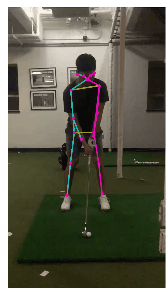

In [27]:
output, front_pts = predict(gif)
output = np.stack(output, axis=0)
to_gif(output, duration=100, name='thunder')

/var/folders/9s/pp2mynj51v9dsggk6b4q08yr0000gn/T/ipykernel_25065/3837801013.py:162: MatplotlibDeprecationWarning: The tostring_rgb function was deprecated in Matplotlib 3.8 and will be removed in 3.10. Use buffer_rgba instead.
  image_from_plot = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
/var/folders/9s/pp2mynj51v9dsggk6b4q08yr0000gn/T/ipykernel_25065/3837801013.py:162: MatplotlibDeprecationWarning: The tostring_rgb function was deprecated in Matplotlib 3.8 and will be removed in 3.10. Use buffer_rgba instead.
  image_from_plot = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
/var/folders/9s/pp2mynj51v9dsggk6b4q08yr0000gn/T/ipykernel_25065/3837801013.py:162: MatplotlibDeprecationWarning: The tostring_rgb function was deprecated in Matplotlib 3.8 and will be removed in 3.10. Use buffer_rgba instead.
  image_from_plot = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
/var/folders/9s/pp2mynj51v9dsggk6b4q08yr0000gn/T/ipykernel_25065/3837801013.py:162: Matp


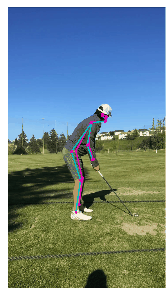

In [28]:
path2 = './processed/sean-back.gif'

gif2 = tf.io.read_file(path2)
gif2 = tf.image.decode_gif(gif2)

back_output, back_pts = predict(gif2)
back_output = np.stack(back_output, axis=0)
to_gif(back_output, duration=100, name='thunder')

In [98]:
front_pts[0][0]

array([[ 952.82605,  534.44696],
       [ 955.9398 ,  525.34283],
       [ 944.8889 ,  530.3343 ],
       [ 971.7228 ,  528.0596 ],
       [ 931.2252 ,  532.7834 ],
       [1002.73737,  557.0813 ],
       [ 910.1609 ,  574.1765 ],
       [1021.94824,  622.9125 ],
       [ 905.6902 ,  635.0658 ],
       [1002.3016 ,  651.5494 ],
       [ 929.43134,  649.4738 ],
       [ 993.21216,  672.9084 ],
       [ 923.944  ,  675.7608 ],
       [1002.3791 ,  774.68787],
       [ 905.13635,  767.9473 ],
       [1044.9957 ,  894.2651 ],
       [ 860.16785,  897.2913 ]], dtype=float32)

In [29]:
def center_pts(kps_arr):
    num_frames = len(kps_arr)
    
    centroid_x = 0
    centroid_y = 0
    num_pts = 0
    
    for i in range(num_frames):
        keypoints = kps_arr[i][0]
        num_pts += len(keypoints)
        centroid_x += sum(keypoints[:, 0])
        centroid_y += sum(keypoints[:, 1])


    centroid_x /= num_pts
    centroid_y /= num_pts
    
    centered_keypoints = []
    centered_edges = []
    

    for i in range(num_frames):
        centered_kps = kps_arr[i][0] - np.array([0, 0])
        x = centered_kps[:, 0]
        y = centered_kps[:, 1]
        x_normalized = (x - np.min(y)) / (np.max(y) - np.min(y))
        y_normalized = (y - np.min(y)) / (np.max(y) - np.min(y))
        y_inverted = np.max(y_normalized) - y_normalized


        x_centered = x_normalized - np.max(x_normalized) + ((np.max(x_normalized) - np.min(x_normalized)) / 2)

        normalized_keypoints = np.column_stack((x_centered, y_inverted))

        edges = kps_arr[i][1]
        shifted = edges - np.array([centroid_x, centroid_y])
        edges_x = shifted[:, :, 0]
        edges_y = shifted[:, :, 1]
        
        edges_y_normalized = (edges_y - np.min(y)) / (np.max(y) - np.min(y))
        inverted_y_edges = np.max(edges_y_normalized) - edges_y_normalized
        
        edges_x_normalized = (edges_x - np.min(y)) / (np.max(y) - np.min(y))
        edges_x_centered = edges_x_normalized - np.max(edges_x_normalized) + ((np.max(edges_x_normalized) - np.min(edges_x_normalized)) / 2)
        
        normalized_edges = np.stack([edges_x_centered, inverted_y_edges], axis=-1)

        centered_keypoints.append(normalized_keypoints)
        centered_edges.append(normalized_edges.reshape(edges.shape))
    
    return centered_keypoints, centered_edges

front_xy, front_edges = center_pts(front_pts)
back_xy, back_edges = center_pts(back_pts)

In [36]:
f_impact = 0.5702127659574469
b_impact = 0.4238854833627431
f_impact_frame = int(len(front_xy) * f_impact)
b_impact_frame = int(len(back_xy) * b_impact)

In [48]:
arr = [1,2,3,4,5,6]
arr2 = [0,0,0,0,0,0,1,2,3,4,5,6,7,8,9,10]
len(arr2)

16

In [50]:
def align_vids(front, f_impact, back, b_impact):
    f_impact_frame = int(len(front) * f_impact)
    b_impact_frame = int(len(back) * b_impact)

    difference = f_impact_frame - b_impact_frame

    if difference > 0:
        front = front[difference::].copy()
    elif difference < 0:
        back = back[abs(difference)::].copy()

    if len(front) < len(back):
        back = back[:len(front)]
    elif len(back) < len(front):
        front = front[:len(back)]

    return front, back
        

In [56]:
prac, prac2 = align_vids(arr, 0.5, arr2, 0.6)

In [57]:
print(prac, prac2)

[1, 2, 3, 4, 5, 6] [1, 2, 3, 4, 5, 6]


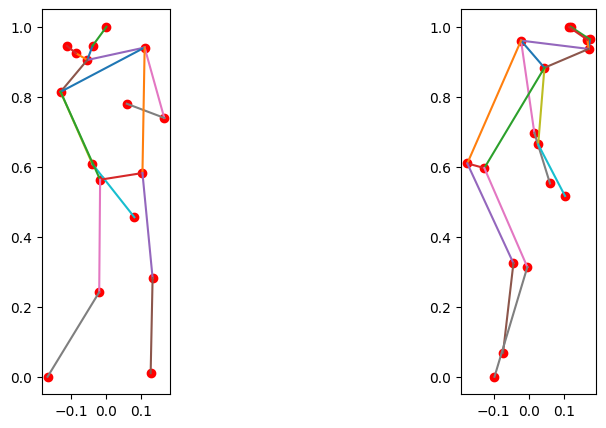

In [37]:
front_points, f_edge = front_xy[f_impact_frame], front_edges[f_impact_frame]
back_points, b_edge = back_xy[b_impact_frame], back_edges[b_impact_frame]

fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(10,5))

ax1.scatter(front_points[:,0], front_points[:, 1], color='red')
ax2.scatter(back_points[:,0], back_points[:, 1], color='red')

for edge in f_edge:
    ax1.plot([edge[0][0], edge[1][0]], [edge[0][1], edge[1][1]])

for bedge in b_edge:
    ax2.plot([bedge[0][0], bedge[1][0]], [bedge[0][1], bedge[1][1]])


ax1.set_aspect('equal')
ax2.set_aspect('equal')
plt.show()

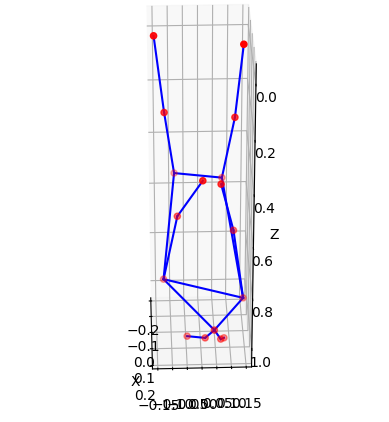

In [31]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import imageio.v2 as imageio  # Use imageio.v2 to avoid the deprecation warning
import os
if not os.path.exists('frames'):
    os.makedirs('frames')

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for the points
ax.scatter(back_points[:,0], front_points[:,0], front_points[:, 1], color='red')

# # Plot the edges
for i, edge in enumerate(f_edge):
    ax.plot([b_edge[i][0][0], b_edge[i][1][0]], [edge[0][0], edge[1][0]], [edge[0][1], edge[1][1]], color='blue')

# Set labels
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

ax.set_aspect('equal')
ax.invert_zaxis()

frames = []
file_paths = []
for angle in range(0, 360, 2):  # Rotate from 0 to 360 degrees
    ax.view_init(elev=30, azim=angle)
    filename = f'frames/frame_{angle}.png'
    plt.savefig(filename)
    frames.append(imageio.imread(filename))
    file_paths.append(filename)

# Create the GIF
imageio.mimsave('rotation.gif', frames, fps=20)

# Cleanup the frames
for filename in file_paths:
    os.remove(filename)

# Display the final plot
plt.show()

In [32]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import imageio.v2 as imageio  # Use imageio.v2 to avoid the deprecation warning
import os

# Create the directory for frames
if not os.path.exists('frames'):
    os.makedirs('frames')

# Assuming you have multiple arrays of points and edges, e.g.:
# `back_points_list`, `front_points_list`, and `f_edge_list`, where each list contains
# arrays for different frames. You need to replace this with your actual data.

# Example dummy data for multiple plots
frames = []
file_paths = []

# Define the total number of plots
num_plots = len(front_xy)

# Loop over each set of points and edges, calculating the angle based on the index
for i in range(num_plots):

    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')

    if len(front_xy[i]) < 17:
        if last_valid_front_xy is not None:
            front_xy[i] = last_valid_front_xy
        else:
            # Insert placeholder if no valid (17, 2) has been encountered yet
            front_xy[i] = np.insert(front_xy[i], 10, [[front_xy[i][9, 0] - 1, front_xy[i][9, 1] - 1]], axis=0)
    else:
        last_valid_front_xy = front_xy[i]  # Update cache with the current (17, 2) front_xy

    # Cache or replace missing points in back_xy
    if len(back_xy[i]) < 17:
        if last_valid_back_xy is not None:
            back_xy[i] = last_valid_back_xy
        else:
            # Insert placeholder if no valid (17, 2) has been encountered yet
            back_xy[i] = np.insert(back_xy[i], 10, [[back_xy[i][9, 0] - 1, back_xy[i][9, 1] - 1]], axis=0)
    else:
        last_valid_back_xy = back_xy[i]  # Update cache with the current (17, 2) back_xy

    # Cache or replace missing edges in front_edges
    if len(front_edges[i]) < 18:
        if last_valid_front_edges is not None:
            front_edges[i] = last_valid_front_edges
        else:
            # Insert a placeholder for edges if no valid (17, ...) edges have been encountered yet
            front_edges[i] = np.vstack([front_edges[i], front_edges[i][-1]])  # Copy last edge
    else:
        last_valid_front_edges = front_edges[i]  # Update cache with the current (17, ...) front_edges

    # Cache or replace missing edges in back_edges
    if len(back_edges[i]) < 18:
        if last_valid_back_edges is not None:
            back_edges[i] = last_valid_back_edges
        else:
            # Insert a placeholder for edges if no valid (17, ...) edges have been encountered yet
            back_edges[i] = np.vstack([back_edges[i], back_edges[i][-1]])  # Copy last edge
    else:
        last_valid_back_edges = back_edges[i]

    # Scatter plot for the points
    ax.scatter(back_xy[i][:, 0], front_xy[i][:, 0], front_xy[i][:, 1], color='red')

    # Plot the edges
    for edge_index in range(len(front_edges[i])):
        ax.plot([back_edges[i][edge_index][0][0], back_edges[i][edge_index][1][0]], [front_edges[i][edge_index][0][0], front_edges[i][edge_index][1][0]], [front_edges[i][edge_index][0][1], front_edges[i][edge_index][1][1]], color='blue')

    # Set labels
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')

    ax.set_aspect('equal')
    ax.invert_zaxis()

    # Calculate the rotation angle based on the plot index, spread across 360 degrees
    angle = ((i / num_plots) * 280) 
    ax.view_init(elev=30, azim=300)

    # Save the frame
    filename = f'frames/frame_{i}.png'
    plt.savefig(filename)
    frames.append(imageio.imread(filename))
    file_paths.append(filename)

    plt.close(fig)

# Create the GIF from all frames
imageio.mimsave('rotation4.gif', frames, fps=20)

# Cleanup the frames
for filename in file_paths:
    os.remove(filename)

# Optionally display the final frame
plt.show()